# Data Observation
The objective of this motebook is:
- Verify the dataset loads correctly.
- Count images per class.
-Visualize a few examples.
- Understand image sizes.
- Prepare for the PyTorch pipeline.

By the end of this notebook, we will know how to load our data, and which transformation is required and which doesn't.

In [1]:
#: Incide coding cells, "# texts" stands for pseudo codes 
#: "#-- texts" stands for coding remarks or comments.

## 0. Import Libraries

In [2]:
import pandas as pd
from PIL import Image
from collections import Counter
import matplotlib.pyplot as plt
from pathlib import Path
import torch
from torchvision import datasets
from torchvision import transforms
import random
random.seed(42)

## 1. Define Paths

In [3]:
# the data directory is situated a layer above the current directory
DATA_DIR = Path("../data/raw/train_images")

print(DATA_DIR.exists())

True


## 2. Count Classes

In [4]:
# initialize classes as empty list
classes = []

# iterate through all the directories in DATA_DIR and list their names
for p in DATA_DIR.iterdir():
    if p.is_dir():
        classes.append(p.name)

#-- we could have used list comprehension instead:
#-- [expression for item in iterable if condition]

# sort the classes alphabetically
classes = sorted(classes)

# print the list
print(classes)

# get the length
print(f"Number of classes: {len(classes)}")

['bacterial_leaf_blight', 'bacterial_leaf_streak', 'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart', 'downy_mildew', 'hispa', 'normal', 'tungro']
Number of classes: 10


## 3. Count images in each class

In [5]:
# initialize the dictionary by creating an empty dictionary
counts = {}

# get the values against the keys - cls
for cls in classes:
    counts[cls] = len(list((DATA_DIR / cls).glob("*.jpg")))

# display
counts

#-- we will use a dataframe later to display it

{'bacterial_leaf_blight': 479,
 'bacterial_leaf_streak': 380,
 'bacterial_panicle_blight': 337,
 'blast': 1738,
 'brown_spot': 965,
 'dead_heart': 1442,
 'downy_mildew': 620,
 'hispa': 1594,
 'normal': 1764,
 'tungro': 1088}

## 4. Load Sample Images

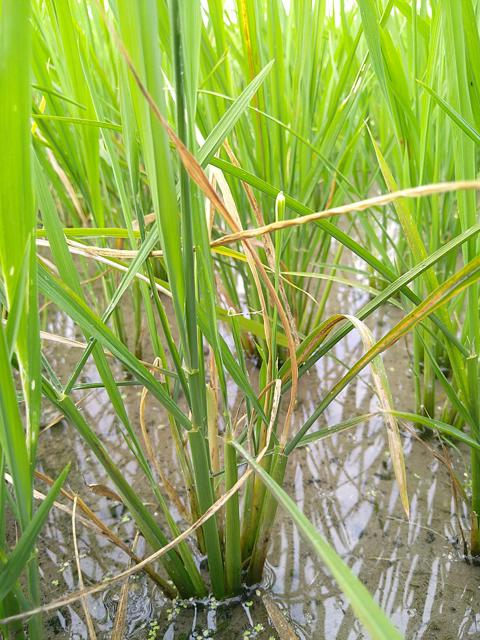

In [6]:
# choose a directory
sample_path = next((DATA_DIR / "blast").glob("*.jpg"))

# open the image
img = Image.open(sample_path)

# display the image
img

In [7]:
# get its size
img.size

(480, 640)

## 5. Display Some Examples

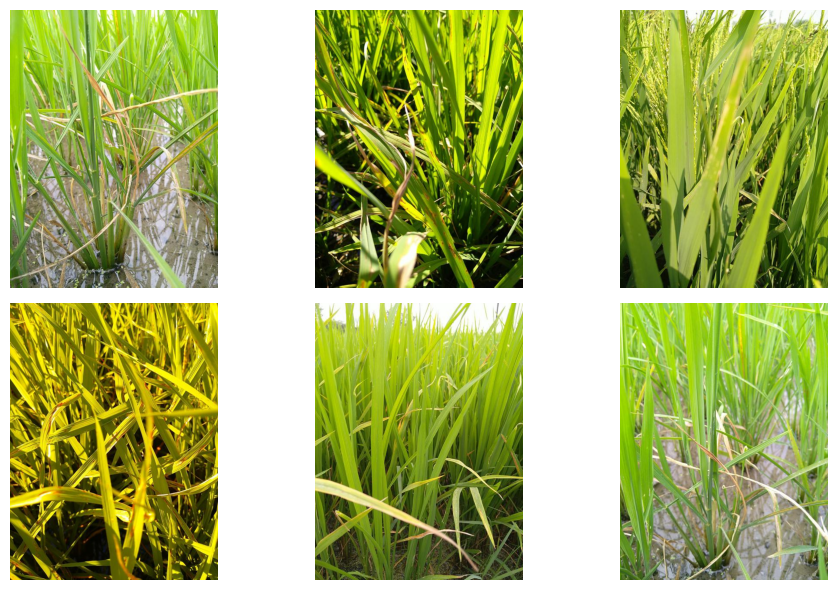

In [8]:
# create a grid of plots with two rows and three columns
# with overall size roughly 10 inch wide and 6 inch tall
fig, axes = plt.subplots(2, 3, figsize=(10, 6))

# find the first six images from the class 'hispa'
# after finding all files inside the class that ends with .jpg
paths = list((DATA_DIR / "blast").glob("*.jpg"))[:6]

# loop through the plots and image paths
# after flattening, since axes is a two dimensional structure, and
# and pairing (using zip())
for ax, path in zip(axes.flatten(), paths):
    img = Image.open(path) # open each image
    ax.imshow(img) # put the image into the plot
    ax.axis("off") # remove the axes
    
# use tight_layout to automatically adjusts the spacing 
# between the plots so that they don't overlap or look cramped.
plt.tight_layout()

## 6. Get the data frame

In [9]:
# convert the dictionary counts into dataframe
class_counts = pd.DataFrame(
    list(counts.items()),
    columns=["class", "num_images"]
)

# sort the dataframe according to 'num_images' column
# in descending order
class_counts = class_counts.sort_values(
    "num_images",
    ascending=False
)

# display
class_counts

,class,num_images
8,normal,1764
3,blast,1738
7,hispa,1594
5,dead_heart,1442
9,tungro,1088
4,brown_spot,965
6,downy_mildew,620
0,bacterial_leaf_blight,479
1,bacterial_leaf_streak,380
2,bacterial_panicle_blight,337


make a simple visualization

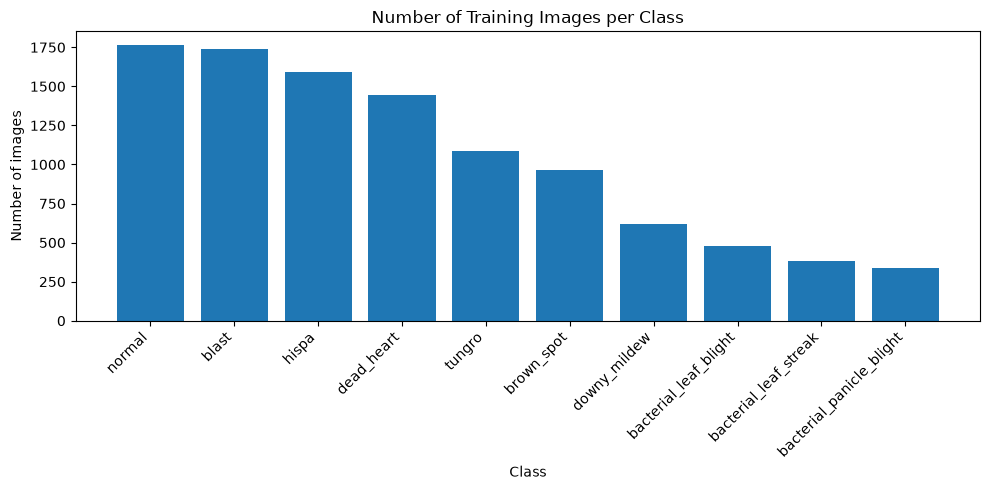

In [10]:
# create the figure with width 10 inches and height 5 inches
plt.figure(figsize=(10, 5))

# create the bar chart with class as categories (x-axis)
# and num_images as values (y-axis)
plt.bar(
    class_counts["class"],
    class_counts["num_images"]
)
#-- Each class gets one bar, and the height of the bar represents the number of images in that class.

plt.xticks(rotation=45, ha="right") # rotate the class names so that they don't overlap
plt.xlabel("Class") # label the x-axis with class
plt.ylabel("Number of images") # label the y-axis with num_images
plt.title("Number of Training Images per Class") # give the chart a title

plt.tight_layout() # take care of the spacing

# display
plt.show()

### Observation

The training dataset is imbalanced across the ten classes. The largest classes,
`normal` and `blast`, contain around 1,700 images each, while
`bacterial_panicle_blight` contains only 337 images.

For now, we will retain the original class distribution and investigate its
effect during model training and evaluation rather than artificially balancing
the dataset at the exploration stage.

## 7. Visualize The dataset
Here, we explore what do the actual images look like.

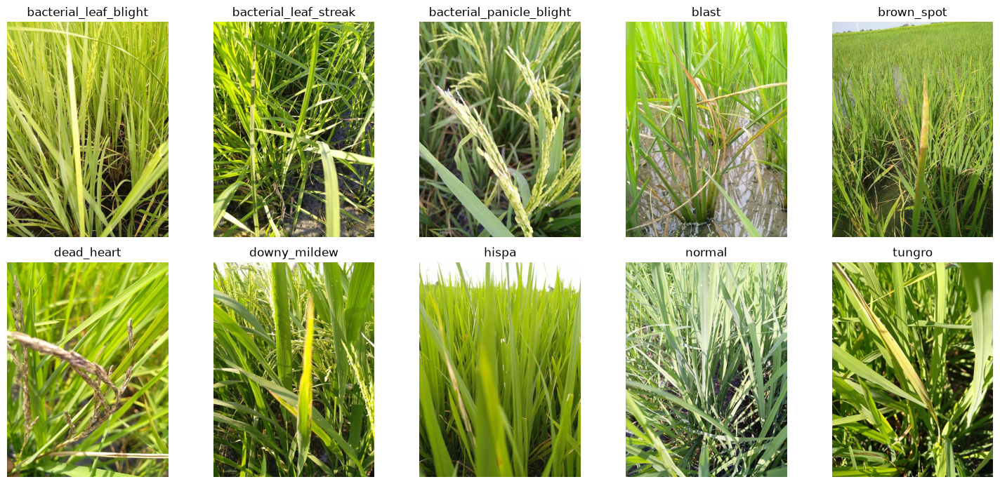

In [11]:
# create a 2 x 5 grid (2 rows, 5 columns; total 10 plot areas)
# with overall size roughly 15 inch wide and 7 inch tall 
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

# loop through the plots and classes after flattening and pairing 
for ax, cls in zip(axes.flat, classes): 
    image_path = next((DATA_DIR / cls).glob("*.jpg")) # get the first matching image of the current class
    image = Image.open(image_path) # open the image

    ax.imshow(image) # display the image
    ax.set_title(cls) # add class name as title
    ax.axis("off") # remove the axes

plt.tight_layout() # take care of spacing

# display the image
plt.show()

next, we inspect one image

In [12]:
# get all jpg image paths in the form of a list
image_paths = list((DATA_DIR / "blast").glob("*.jpg"))

# randomly choose one image
sample_path = random.choice(image_paths)

# open the selected image
sample_image = Image.open(sample_path)

# print the size of selected image
print(f"Image size: {sample_image.size}")

# get the image mode, i.e., how it stores color
print(f"Image mode: {sample_image.mode}")


Image size: (480, 640)
Image mode: RGB


### 7.1: Image Dimension

In [13]:
image_sizes = Counter()

# loop through every class
for cls in classes:
    for image_path in (DATA_DIR / cls).glob("*.jpg"): # find every jpg in the current class
        with Image.open(image_path) as image: # open each image
            image_sizes[image.size] += 1 #get the image size 
# display
image_sizes

Counter({(480, 640): 10403, (640, 480): 4})

#### Observation

The training images are almost uniform in size. Of the 10,407 images,
10,403 have dimensions `(480, 640)`, while 4 images have dimensions
`(640, 480)`.

Therefore, the preprocessing pipeline will need to handle images with
slightly different orientations/sizes and convert them to a common input
format before training.

## 8. Variation Within Classes
The code below creates a grid showing 6 random images from each of two classes: `blast` and `normal`:

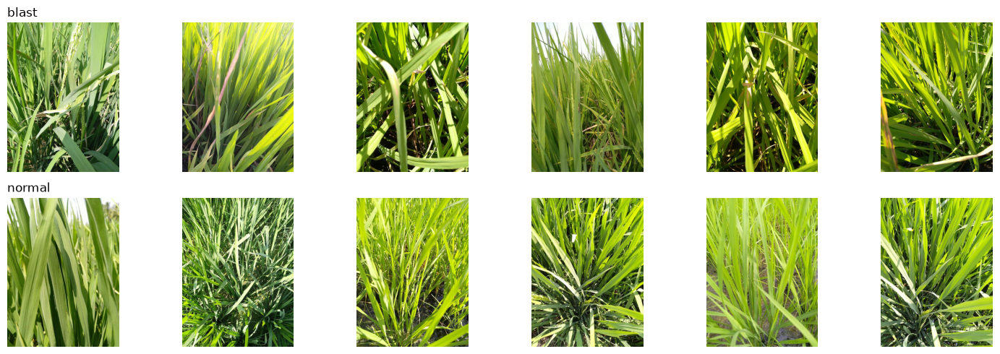

In [14]:
# select the classes
selected_classes = ["blast", "normal"]

# create the plotting grid of size (len(sselected_classes) x 6)
# with overall size of width 15 and height 5
fig, axes = plt.subplots(
    len(selected_classes),
    6,
    figsize=(15, 5)
)

# loop throguh the classes
for row, cls in enumerate(selected_classes):
    image_paths = list((DATA_DIR / cls).glob("*.jpg")) # find all (jpg) images for the class
    selected_paths = random.sample(image_paths, 6)  # choose randomly 6 images from this path

    # loop through the six images
    for col, image_path in enumerate(selected_paths):
        image = Image.open(image_path) # open the image

        axes[row, col].imshow(image) # put the image in the correct grid position
        axes[row, col].axis("off") # don't display the axes

    axes[row, 0].set_title(cls, loc="left", fontsize=12) # put the class name on the first image of each row

plt.tight_layout() # take care of spacing

# display
plt.show()

## 7. Preparing the Dataset with TorchVision
We use `torchvision.datasets.ImageFolder` to load the training images.
The directory structure provides the class labels, since each class has
its own subdirectory.

In [15]:
# create the dataset without transformation
train_dataset = datasets.ImageFolder(
    root=DATA_DIR
)

inspect it

In [16]:
print(f"Number of images: {len(train_dataset)}")
print(f"Classes: {train_dataset.classes}")
print(f"Class-to-index mapping: {train_dataset.class_to_idx}")

Number of images: 10407
Classes: ['bacterial_leaf_blight', 'bacterial_leaf_streak', 'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart', 'downy_mildew', 'hispa', 'normal', 'tungro']
Class-to-index mapping: {'bacterial_leaf_blight': 0, 'bacterial_leaf_streak': 1, 'bacterial_panicle_blight': 2, 'blast': 3, 'brown_spot': 4, 'dead_heart': 5, 'downy_mildew': 6, 'hispa': 7, 'normal': 8, 'tungro': 9}


Now, let's inspect one item:

In [17]:
image, label = train_dataset[0]

print(f"Type of image: {type(image)}")
print(f"Label: {label}")

Type of image: <class 'PIL.Image.Image'>
Label: 0


In [18]:
print(f"Image size: {image.size}")
print(f"Image mode: {image.mode}")

Image size: (480, 640)
Image mode: RGB


In [19]:
# class that correspond to this label
print(train_dataset.classes[label]) 

bacterial_leaf_blight


## 8. Applying TorchVision Transforms
The images are currently returned as PIL images. Neural networks in PyTorch
operate on tensors, so we need to transform the images into tensors and
eventually resize them to a common input size.

### 8.1: Convert to tensor

In [20]:
# start with conversion to tensor from PIL
transform = transforms.ToTensor()

In [21]:
# create another dataset, now using transform
train_dataset_tensor = datasets.ImageFolder(
    root=DATA_DIR,
    transform=transform
)

Now inspect the same type of item:

In [22]:
image_tensor, label = train_dataset_tensor[0]

print(f"Type: {type(image_tensor)}")
print(f"Shape: {image_tensor.shape}")
print(f"Label: {label}")

Type: <class 'torch.Tensor'>
Shape: torch.Size([3, 640, 480])
Label: 0


verify the value range:

In [23]:
print(f"Minimum pixel value: {image_tensor.min()}")
print(f"Maximum pixel value: {image_tensor.max()}")

Minimum pixel value: 0.0
Maximum pixel value: 1.0


### 8.2: Resize Images
The images have dimensions of approximately 480 × 640. Neural networks,
and particularly pretrained models, generally expect inputs of a fixed size.
We therefore need to resize the images as part of the preprocessing pipeline.

In [24]:
transform_resize = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

In [25]:
train_dataset_resize = datasets.ImageFolder(
    root=DATA_DIR,
    transform=transform_resize
)

In [26]:
image_tensor, label = train_dataset_resize[0]

print(f"Shape: {image_tensor.shape}")
print(f"Label: {label}")

Shape: torch.Size([3, 224, 224])
Label: 0


Note, that the aspect ratio is not preserved during the transformation, which means that image will get stretched. This is intentional for the moment, as this notebook is experimental and we are individually exploring each transform.

### 8.3: Resizing While Preserving Aspect Ratio

Instead of specifying both dimensions, `Resize` can be given a single
integer. In this case, the shorter edge is resized to the specified size
while preserving the original aspect ratio.

In [27]:
transform_preserve_ratio = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor()
])

In [28]:
train_dataset_preserve_ratio = datasets.ImageFolder(
    root=DATA_DIR,
    transform=transform_preserve_ratio
)

Now inspect, we don't expect it to be (224, 224):

In [29]:
image_tensor, label = train_dataset_preserve_ratio[0]

print(f"Shape: {image_tensor.shape}")

Shape: torch.Size([3, 298, 224])


transforms.resize(n) makes shorter edge of size n and decide the other edge using the aspect ratio, which is fixed as the original PIL image. However, that doesn't give us the fixed (224,224); this is where `RandomCrop` comes to rescue.

### 8.4 Random Crop

After resizing while preserving the aspect ratio, we can crop the image to a
fixed spatial size. `RandomCrop` selects a random region of the specified
size from the image.

In [30]:
transform_random_crop = transforms.Compose([
    transforms.Resize(224),
    transforms.RandomCrop((224, 224)),
    transforms.ToTensor()
])

In [31]:
train_dataset_random_crop = datasets.ImageFolder(
    root=DATA_DIR,
    transform=transform_random_crop
)

Now inspect:

In [32]:
image_tensor, label = train_dataset_random_crop[0]

print(f"Shape: {image_tensor.shape}")
print(f"Label: {label}")

Shape: torch.Size([3, 224, 224])
Label: 0


Because RandomCrop is random, the same image can produce different crops:

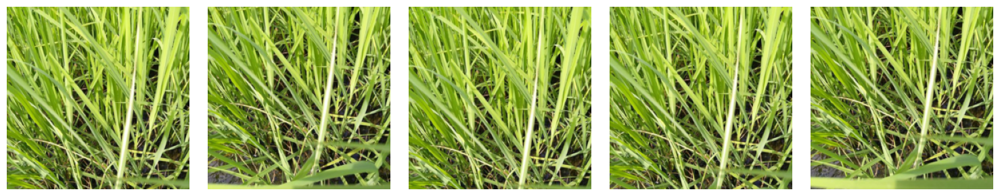

In [33]:
# make a plot with 1 row and 5 columns, with 
# overall figure size of width 15 and height 3
fig, axes = plt.subplots(1, 5, figsize=(15, 3))

# loop through the plots
for ax in axes:
    image_tensor, _ = train_dataset_random_crop[0]
    
    # permute to be consistent with matplotlib 
    ax.imshow(image_tensor.permute(1, 2, 0))
    ax.axis("off")

plt.tight_layout() # take care of spacing

# display
plt.show()

It's important to consider the question:
"Could randomly cropping a rice-leaf photograph remove the actual disease features that the model needs?"

For a generic ImageNet object, random cropping is often very reasonable because the object may occupy only part of the image. However, for our plant disease classification, however, the relevant symptom may be a relatively small region of a leaf. An aggressive crop could potentially remove useful information.

## 8.5 Center Crop
`CenterCrop` extracts a crop of the specified size from the center of the
image. Unlike `RandomCrop`, the same input image produces the same crop each
time.

In [34]:
transform_center_crop = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop((224, 224)),
    transforms.ToTensor()
])

In [35]:
train_dataset_center_crop = datasets.ImageFolder(
    root=DATA_DIR,
    transform=transform_center_crop
)

In [36]:
image_tensor, label = train_dataset_center_crop[0]

print(f"Shape: {image_tensor.shape}")
print(f"Label: {label}")

Shape: torch.Size([3, 224, 224])
Label: 0


Now, visualize the same image several times:

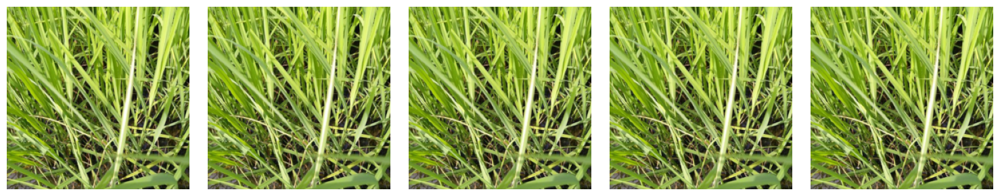

In [37]:
# make a plot with 1 row and 5 columns
# with an overall size of w 15 and h 3
fig, axes = plt.subplots(1, 5, figsize=(15, 3))

# loop through the plots
for ax in axes:
    image_tensor, _ = train_dataset_center_crop[0]

    # permute to be consistent with matplotlib 
    ax.imshow(image_tensor.permute(1, 2, 0))

    # do not display the axes
    ax.axis("off")

# take care of spacing
plt.tight_layout() 

# display
plt.show()

#### Observation

`CenterCrop` produces the same output for the same input image because the
crop is deterministic. It preserves the aspect ratio during resizing, then
extracts a fixed-size region from the center.

Compared with `RandomCrop`, it does not provide random spatial variation
during training.

## 8.6 Random Resized Crop
`RandomResizedCrop` first selects a random crop of the original image and
then resizes that crop to the requested output size. The crop can vary in
both location and scale.

In [38]:
transform_random_resized_crop = transforms.Compose([
    transforms.RandomResizedCrop((224, 224)),
    transforms.ToTensor()
])

In [39]:
train_dataset_random_resized_crop = datasets.ImageFolder(
    root=DATA_DIR,
    transform=transform_random_resized_crop
)

check the output:

In [40]:
image_tensor, label = train_dataset_random_resized_crop[0]

print(f"Shape: {image_tensor.shape}")
print(f"Label: {label}")

Shape: torch.Size([3, 224, 224])
Label: 0


visualize the same image five times:

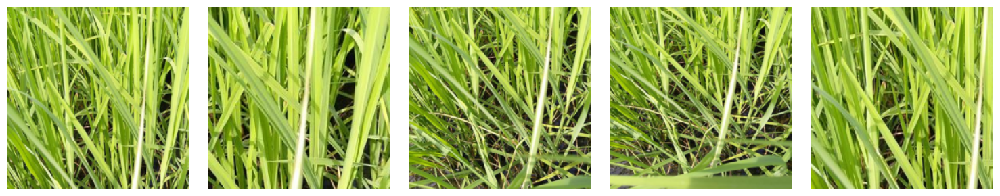

In [41]:
# make a plot with 1 row and 5 column 
# with an overall size of width 15 and height 3
fig, axes = plt.subplots(1, 5, figsize=(15, 3))

# loop through plots
for ax in axes:
    image_tensor, _ = train_dataset_random_resized_crop[0]

    # permute to be consistent with matplotlib 
    ax.imshow(image_tensor.permute(1, 2, 0))

    # don't display the axes 
    ax.axis("off")

# take care of spscing
plt.tight_layout()

# display 
plt.show()

#### Observation

`RandomResizedCrop` produces different 224 × 224 views of the same input
image. Unlike `RandomCrop`, it introduces variation in both the position and
scale of the selected region.

This can increase the diversity of training examples, but for Paddy Disease
Classification we need to consider whether a crop might remove important
visual symptoms of a disease. Its usefulness will therefore be evaluated
experimentally during model training.

### 8.7: Horizontal Flip
`Does flipping a diseased rice leaf horizontally change its class?` We should expect that the disease category itself doesn't depend on left-versus-right orientation, which makes horizontal flipping a plausible augmentation later.

In [43]:
transform_horizontal_flip = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=1.0), # p = 1.0 guarantees the transform
    transforms.ToTensor()
])

In [44]:
train_dataset_horizontal_flip = datasets.ImageFolder(
    root=DATA_DIR,
    transform=transform_horizontal_flip
)

and visualize the original and flipped versions side by side:

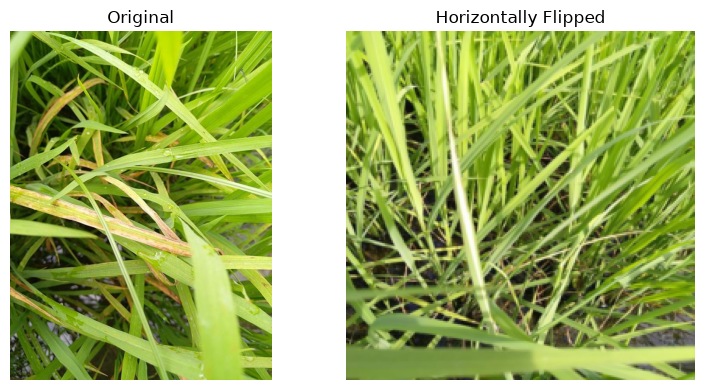

In [45]:
# get the original image
original_image = Image.open(sample_path)

# get the flipped image
flipped_image_tensor, _ = train_dataset_horizontal_flip[0]

# make a plot juxtaposing them side-by-side
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

axes[0].imshow(original_image)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(flipped_image_tensor.permute(1, 2, 0))
axes[1].set_title("Horizontally Flipped")
axes[1].axis("off")

# take care of spacing
plt.tight_layout()

# display
plt.show()

### Observation

Horizontal flipping changes the spatial orientation of the image but does not
change the disease category. Therefore, horizontal flipping is a plausible
data augmentation for this classification problem.

Here `p=1.0` was used only to demonstrate the transformation. During training,
a probability such as `p=0.5` can be used so that some images are flipped and
others remain unchanged.

### 8.8 Vertical Flip
A horizontal reflection of a rice-leaf photograph is quite natural. A vertical reflection corresponds to turning the photograph upside down. That may or may not be a sensible augmentation for this particular problem.

Let's test it rather than assuming.

In [46]:
transform_vertical_flip = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomVerticalFlip(p=1.0),
    transforms.ToTensor()
])

In [47]:
train_dataset_vertical_flip = datasets.ImageFolder(
    root=DATA_DIR,
    transform=transform_vertical_flip
)

visualize:

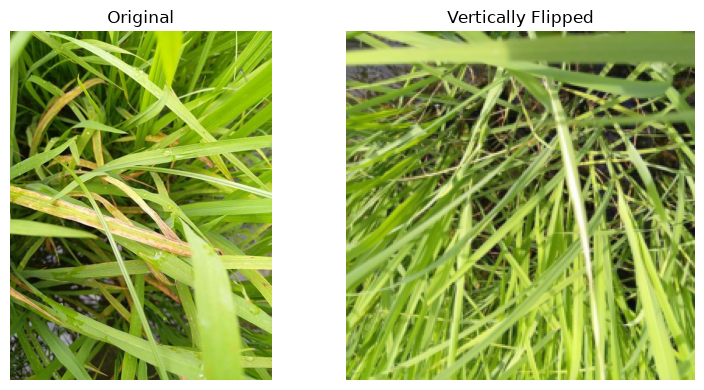

In [48]:
vertical_image_tensor, _ = train_dataset_vertical_flip[0]

fig, axes = plt.subplots(1, 2, figsize=(8, 4))

axes[0].imshow(original_image)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(vertical_image_tensor.permute(1, 2, 0))
axes[1].set_title("Vertically Flipped")
axes[1].axis("off")

plt.tight_layout()
plt.show()

### Observation

`RandomVerticalFlip` flips the image along the vertical axis. Although this
transformation preserves the disease label mathematically, a vertically
flipped photograph corresponds to an unusual orientation of the rice plant.

Therefore, vertical flipping may be less appropriate as a data augmentation
than horizontal flipping. We will treat this as an experimental choice rather
than automatically including it in the final training pipeline.

`Not every mathematically valid transformation is a semantically valid augmentation.`

### 8.9: Rotation

In [49]:
transform_rotation = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(degrees=20),
    transforms.ToTensor()
])

In [50]:
train_dataset_rotation = datasets.ImageFolder(
    root=DATA_DIR,
    transform=transform_rotation
)

visualize several versions:

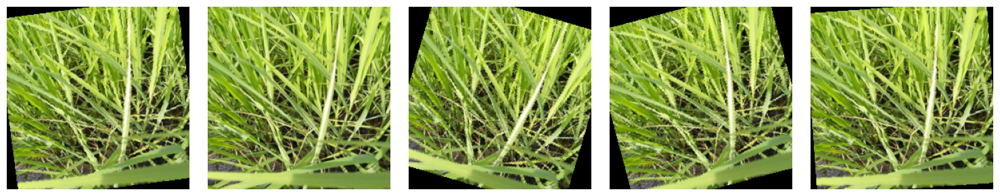

In [51]:
fig, axes = plt.subplots(1, 5, figsize=(15, 3))

for ax in axes:
    image_tensor, _ = train_dataset_rotation[0]

    ax.imshow(image_tensor.permute(1, 2, 0))
    ax.axis("off")

plt.tight_layout()
plt.show()

#### Observation

`RandomRotation` produces different orientations of the same image while
preserving the class label. However, rotating a rectangular image can create
empty regions at the corners, which are represented as black pixels by the
current transformation.

The choice of rotation range and the treatment of these regions should
therefore be considered when designing the final augmentation pipeline.

### 8.10: Color Jitter

In [52]:
transform_color_jitter = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ColorJitter(
        brightness=0.3,
        contrast=0.3,
        saturation=0.3,
        hue=0.05
    ),
    transforms.ToTensor()
])

In [53]:
train_dataset_color_jitter = datasets.ImageFolder(
    root=DATA_DIR,
    transform=transform_color_jitter
)

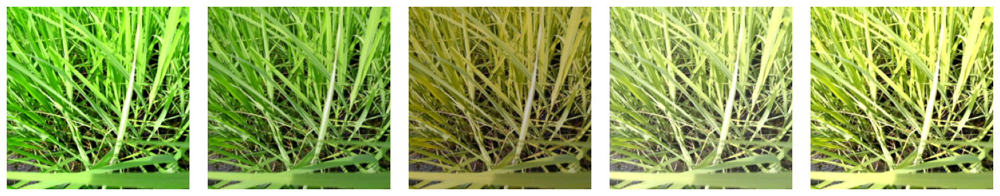

In [54]:
fig, axes = plt.subplots(1, 5, figsize=(15, 3))

for ax in axes:
    image_tensor, _ = train_dataset_color_jitter[0]

    ax.imshow(image_tensor.permute(1, 2, 0))
    ax.axis("off")

plt.tight_layout()
plt.show()

### Observation

Although `ColorJitter` can make the model more robust to changes in lighting
and color, it may be problematic for plant disease classification.

Color can itself contain important information about disease symptoms.
Therefore, strong changes in brightness, contrast, saturation, or hue could
alter or obscure disease-relevant visual features.

For this reason, `ColorJitter` will not be included automatically in the
final augmentation pipeline. Its usefulness would need to be established
experimentally.